In [310]:
import numpy as np
import pandas as pd
from urllib.request import urlopen
import json
import os
os.chdir('c:/Users/aleek/Downloads/tour-events.csv/')
pd.set_option('display.height', 1000)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
import requests
from shapely.geometry import mapping, shape
from shapely.prepared import prep
from shapely.geometry import Point
import datetime
import seaborn as sns
from geopy.geocoders import Nominatim
import matplotlib.pyplot as plt
from scipy.stats import linregress
geolocator = Nominatim()
retention_rate_df = pd.DataFrame(columns=["Country", "Gradient"])
counter = 0

#Glossary:
#CohortGroup : The first date when customers used Komoot
#CohortPeriod : Increments in time(monthly or yearly as defined) from Cohort Group.

#Google API provides a very scalable and accurate way for reverse geocoding. However, the premium version(>1000 requests a day) is quite expensive and I didnt have access to it. However, I have use a temporary solution were I download a json file containing coordinates and locations. This is not completely accurate and relies on interpolation but it is the best free version I've got.

# I already download the json lat,long file from "https://raw.githubusercontent.com/datasets/geo-countries/master/data/countries.geojson"

data = open('countries.json').read()
data = json.loads(data)
countries = {}
for feature in data["features"]:
    geom = feature["geometry"]
    country = feature["properties"]["ADMIN"]
    countries[country] = prep(shape(geom))

def get_country(lon, lat):
    point = Point(lon, lat)
    for country, geom in countries.items():
        if geom.contains(point):
            return country

    return "unknown"

In [139]:
dataset = pd.read_csv('tour-events.csv')

In [140]:
#Converting lat,long to country. If you already have a google API account, you can configure it and use the command below else the json file will have to do.
#dataset['country'] = dataset.apply(lambda row: pd.Series(geolocator.reverse((str(row['latitude'])+','+str(row['longitude'])).replace(" ", ""),language='en').raw['address']['country']),axis=1)
dataset['country'] = dataset.apply(lambda row: pd.Series(get_country(row['longitude'],row['latitude'])),axis=1)

In [311]:
def cohort_period(df):
    """
    Creates a `CohortPeriod` column, which is the Nth period based on the user's first purchase.

    """
    df['CohortPeriod'] = np.arange(len(df)) + 1
    return df

def calcohort(coun):
    global counter
    #Selects country
    dataset_current = dataset[dataset.country==coun]
    #Create a CohortGroup column which indicates the first usage date of the customer. OrderPeriod corresponds to the dates the user used Komoot.
    fod=dataset_current.groupby('user')['timestamp'].min().reset_index()
    dataset_current=pd.merge(fod,dataset_current,on='user')
    dataset_current=dataset_current.rename(columns={'timestamp_y':'OrderPeriod','timestamp_x':'CohortGroup'})
    #Data is too granular(day level). I choose on a monthly level. Change 7 below to 4 for yearly level.
    dataset_current.OrderPeriod=dataset_current.OrderPeriod.map(lambda x: x[0:7])
    dataset_current.CohortGroup=dataset_current.CohortGroup.map(lambda x: x[0:7])
    #Count number of unique customers on every CohortGroup, OrderPeriod combination. Country is irrelevant since it stays the same.
    grouped = dataset_current.groupby(['CohortGroup','OrderPeriod','country'])
    cohorts = grouped.agg({'user': pd.Series.nunique})
    cohorts=cohorts.rename(columns={'user':'TotalUsers'})
    #Creating CohortPeriod which are basically months starting from the CohortGroup. Refer to cohort_period function.
    cohorts = cohorts.groupby(level=0).apply(cohort_period)
    # reindex the DataFrame
    cohorts.reset_index(inplace=True)
    cohorts.set_index(['CohortGroup', 'CohortPeriod'], inplace=True)
    # create a Series holding the total size of each CohortGroup
    cohort_group_size = cohorts['TotalUsers'].groupby(level=0).first()
    # Scale that series so we can express CohortPeriod numbers as a percentage of CohortGroup acquisition number. Eg 10 users first used Komoot in 01-2017. 5 did in 02-2017. Therefore 1,0.5 is displayed.
    user_retention = cohorts['TotalUsers'].unstack(0).divide(cohort_group_size, axis=1)
    #Calculating the retention rate per country for a quick interpretation. Here I am summing the coefficients per CohortPeriod and finding the gradient of the regression line. This is a direct indicator of a countries retention rate. Note that a value of 0 means that there is a 100% retention rate. And a NaN means a 0 % retention rate becuase all the users in the country only booked once.
    regression_table=user_retention.T.sum().reset_index()[0]
    slope = linregress(range(len(regression_table.values)),regression_table.values)[0]
    retention_rate_df.loc[counter]=[coun,slope]
    counter=counter+1
    #Over here I am just plotting the CohortPeriod against the Retention rate for all the CohortGroups. There is too much data for a line plot. Therefore seaborn provides an easy to read heatmap.
    sns.set(style='white')
    plt.figure(figsize=(40, 40))
    #Country name may be hard to read but it is present at the top of every plot
    plt.title(coun+': User Retention')
    ax = sns.heatmap(user_retention.T, mask=user_retention.T.isnull(), annot=True, fmt='.0%')
    ax.set_yticklabels(ax.get_yticklabels(),rotation=45)
    return retention_rate_df

C:\Users\aleek\Anaconda3\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
C:\Users\aleek\Anaconda3\lib\site-packages\scipy\stats\_stats_mstats_common.py:107: RuntimeWarning: invalid value encountered in double_scalars
  slope = r_num / ssxm
C:\Users\aleek\Anaconda3\lib\site-packages\scipy\stats\_stats_mstats_common.py:117: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
C:\Users\aleek\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
C:\Users\aleek\Anaconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: Runti

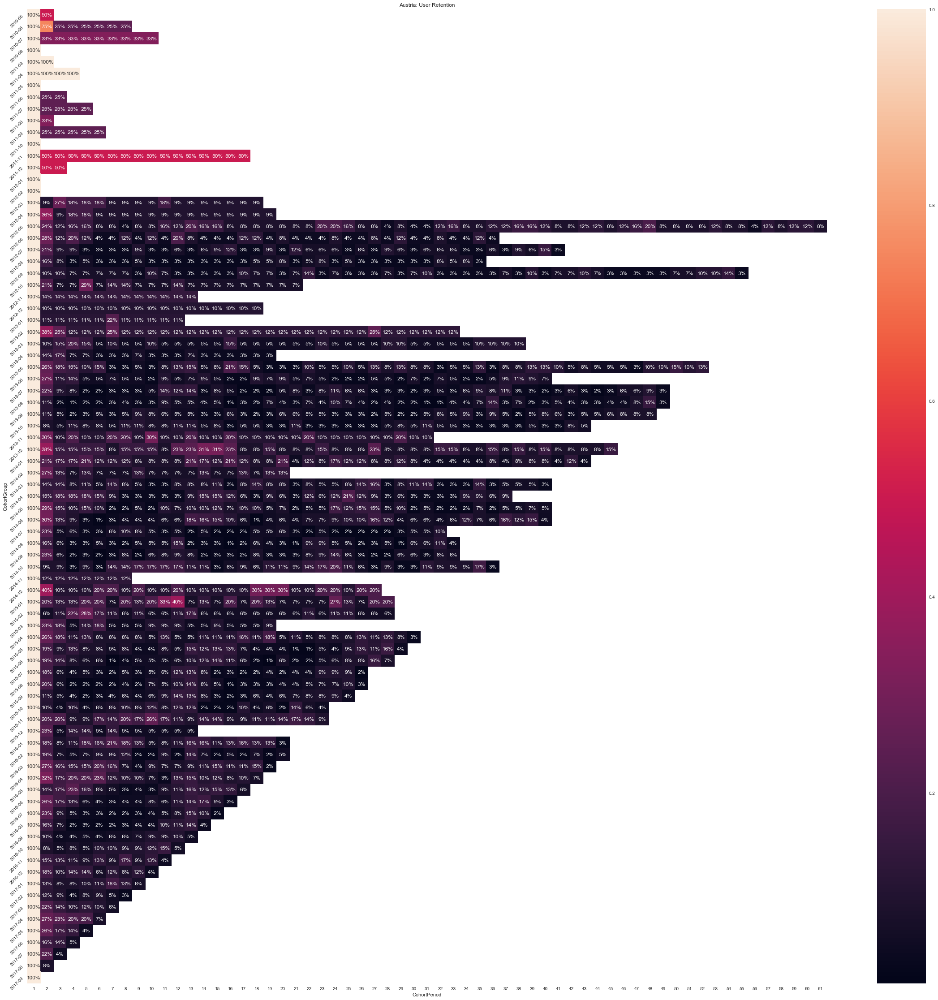

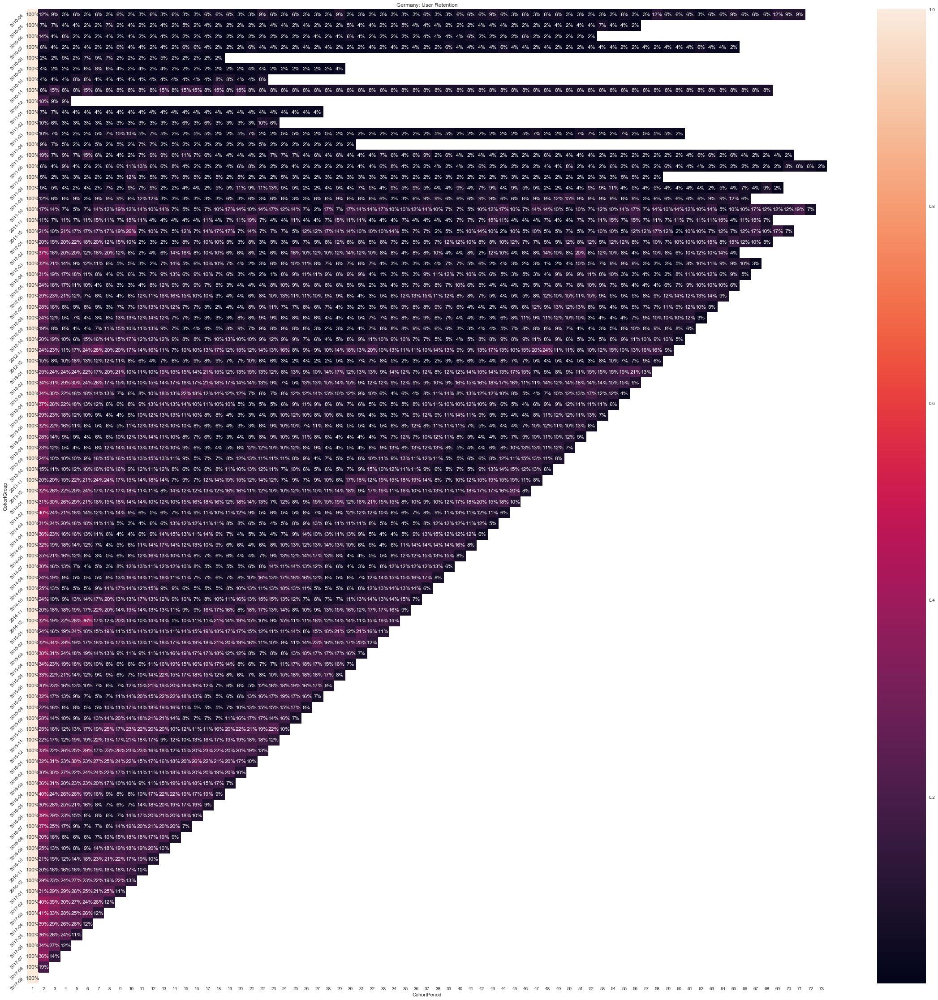

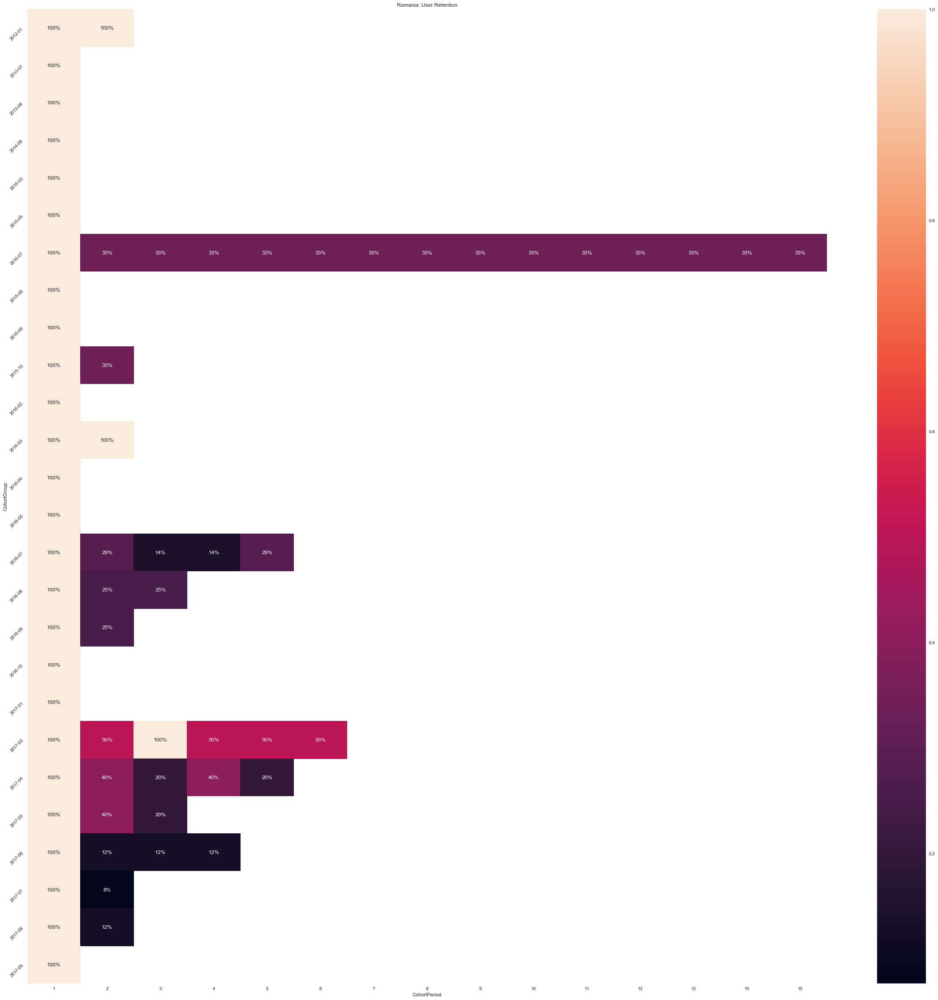

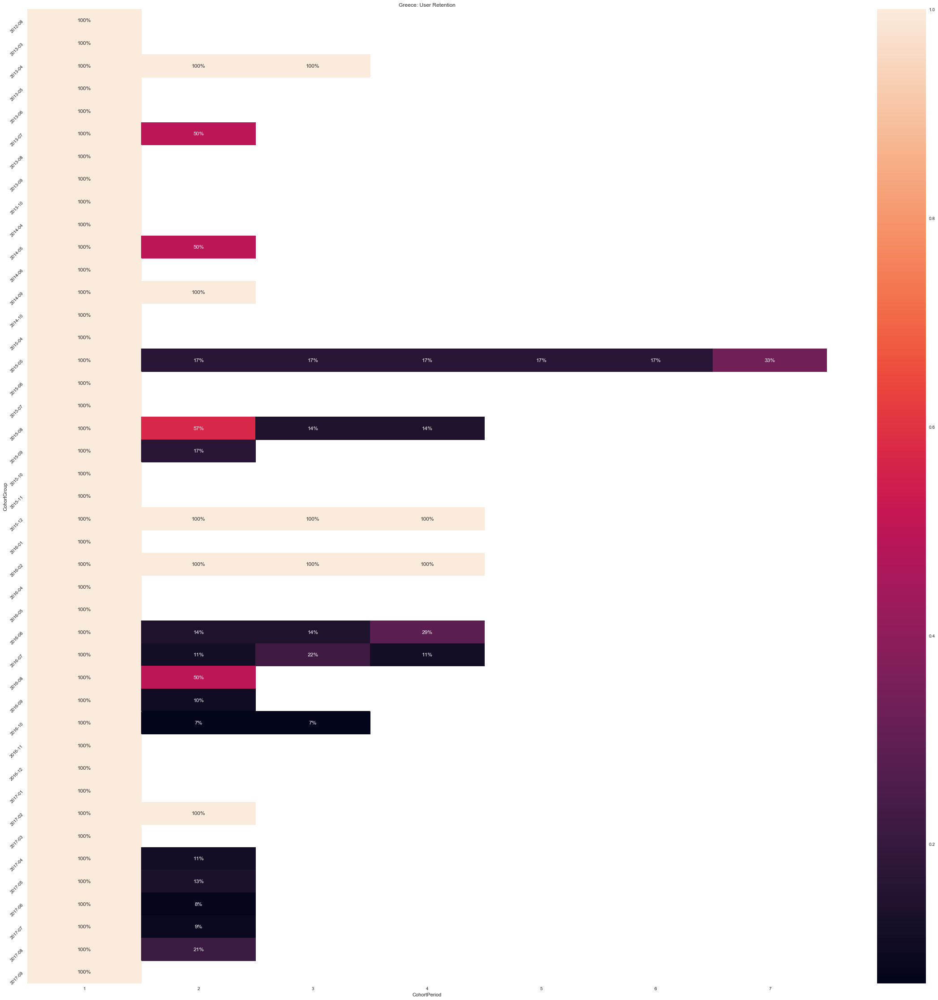

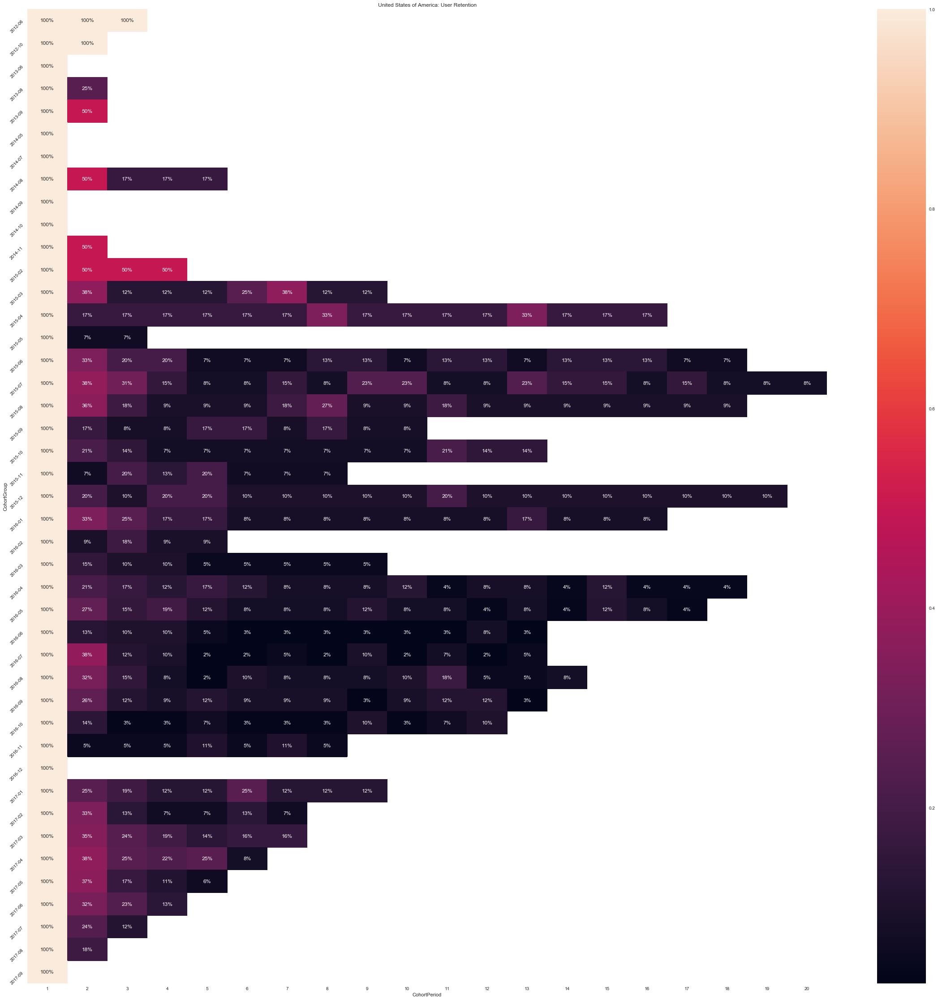

...

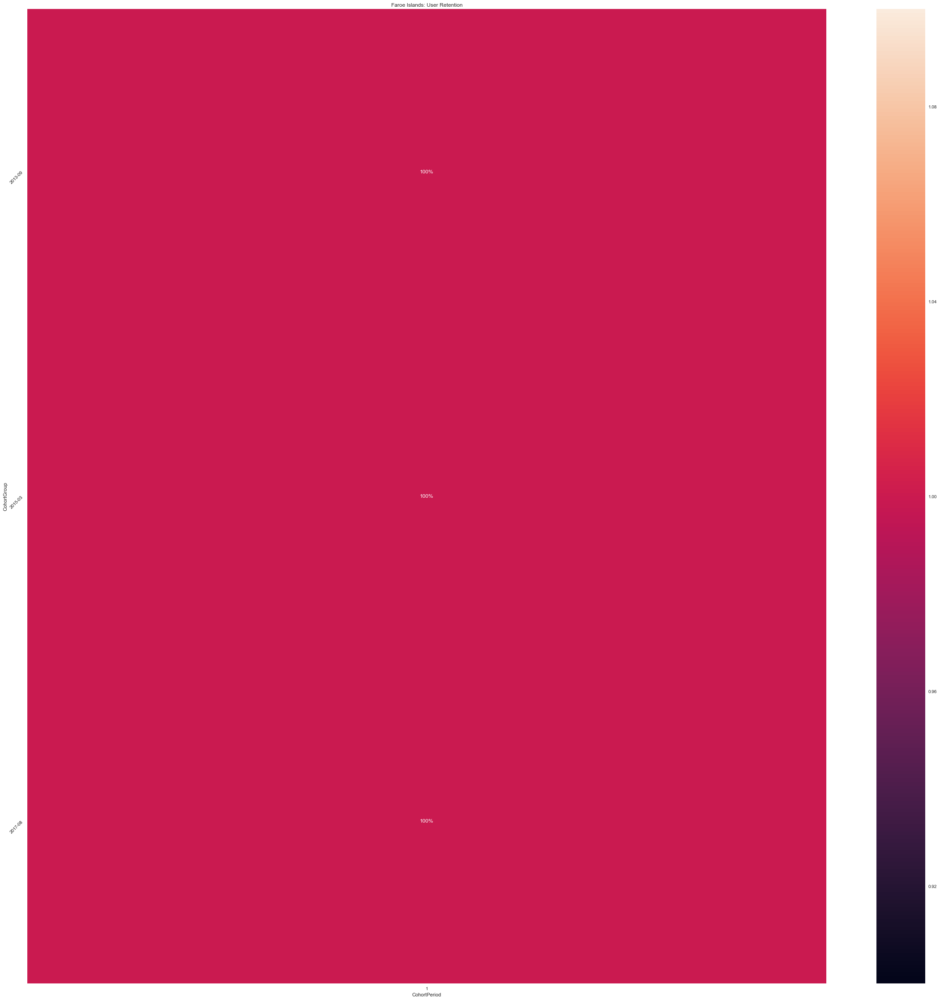

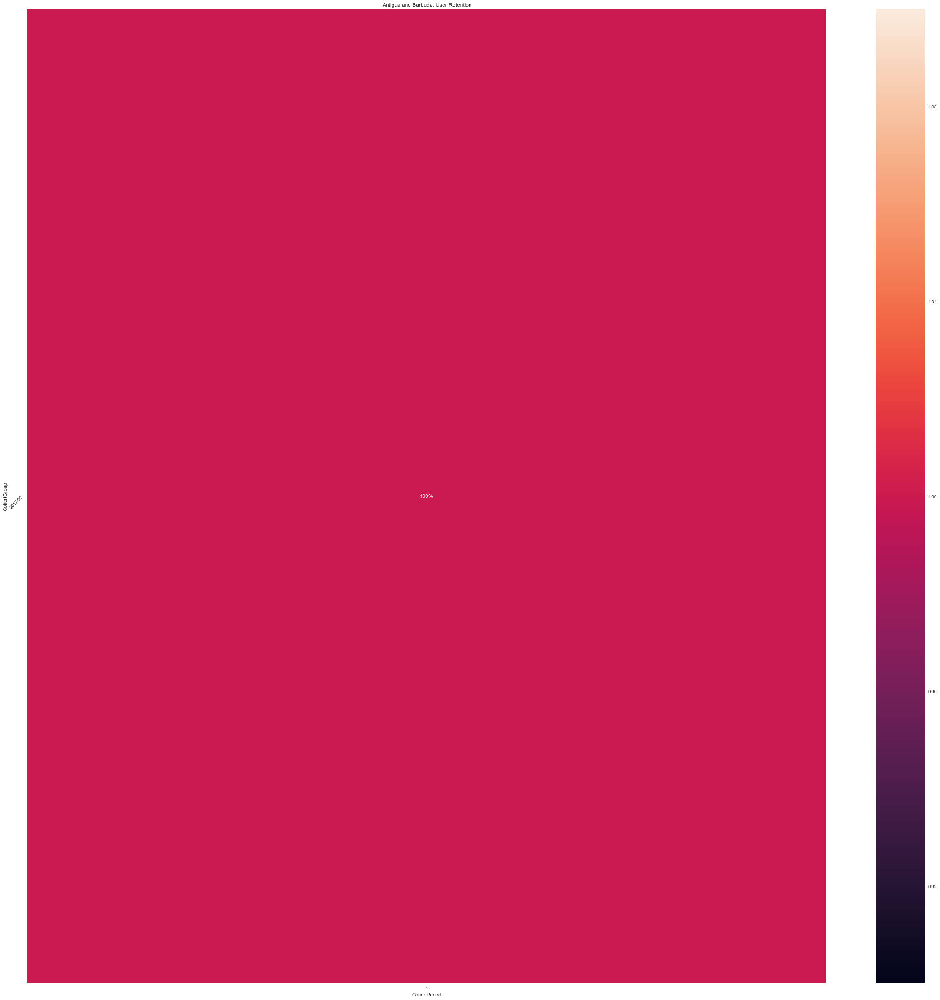

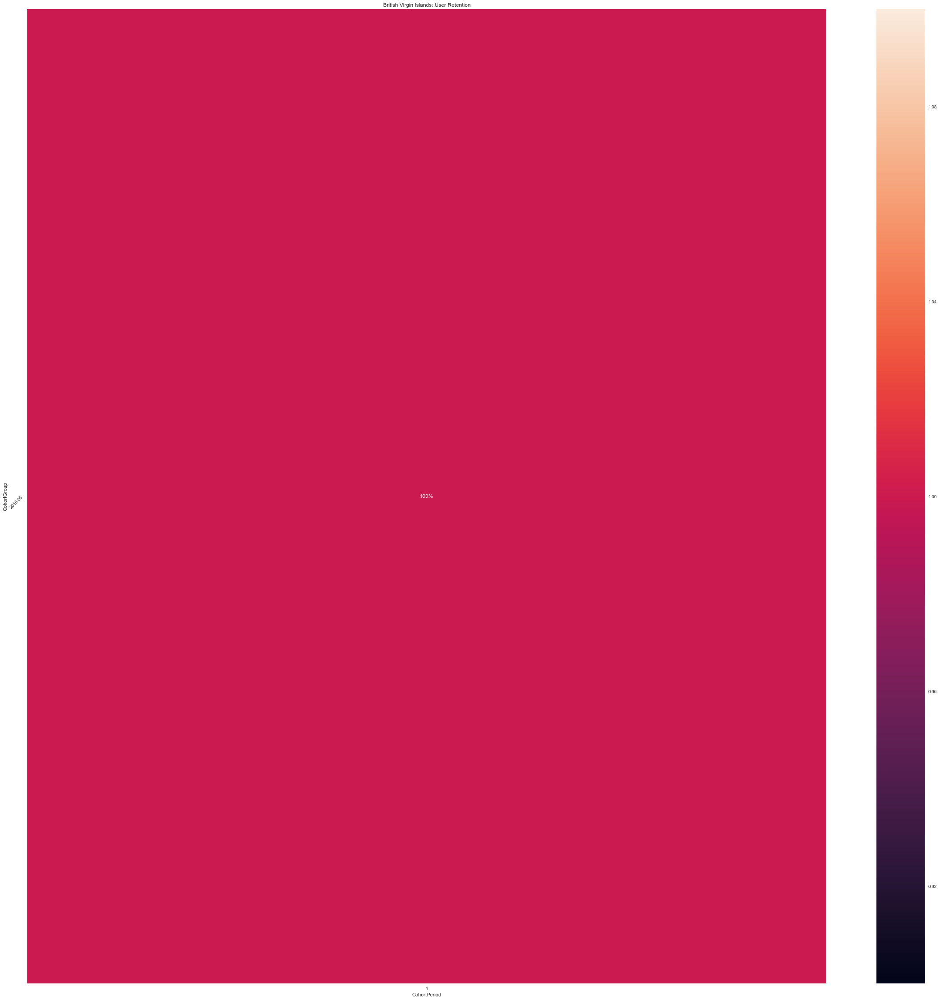

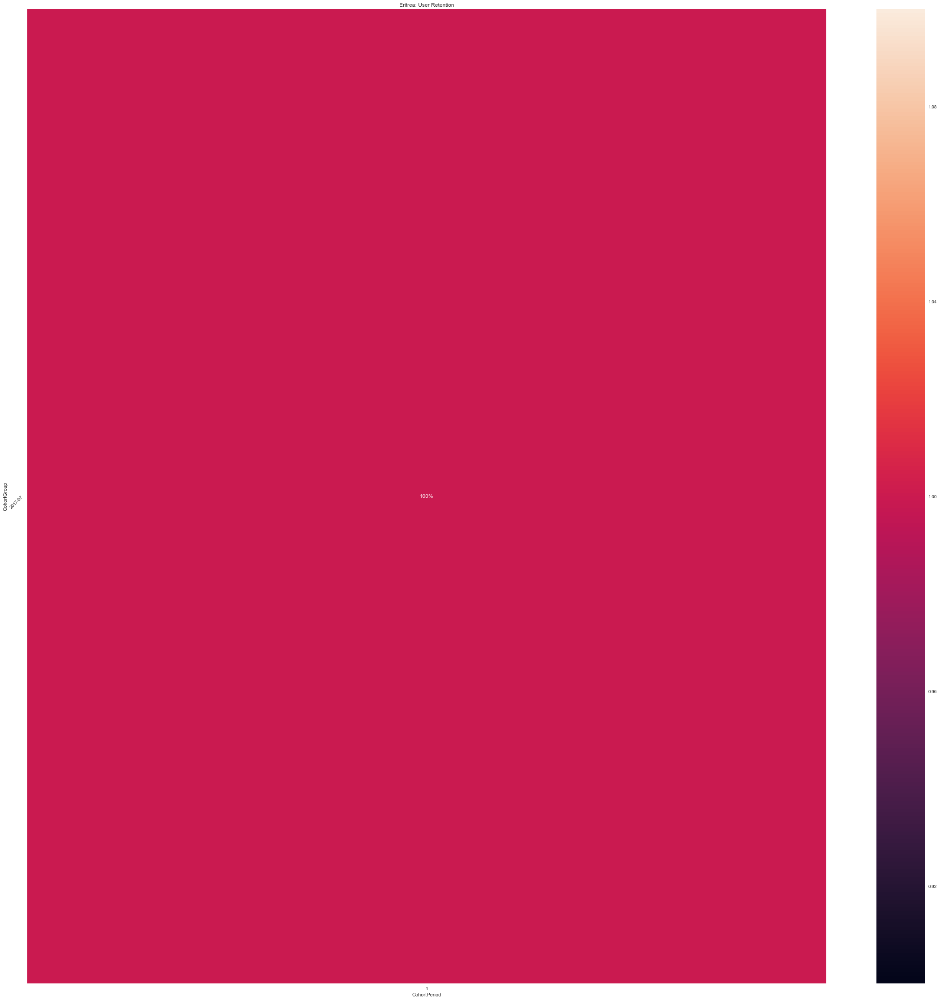

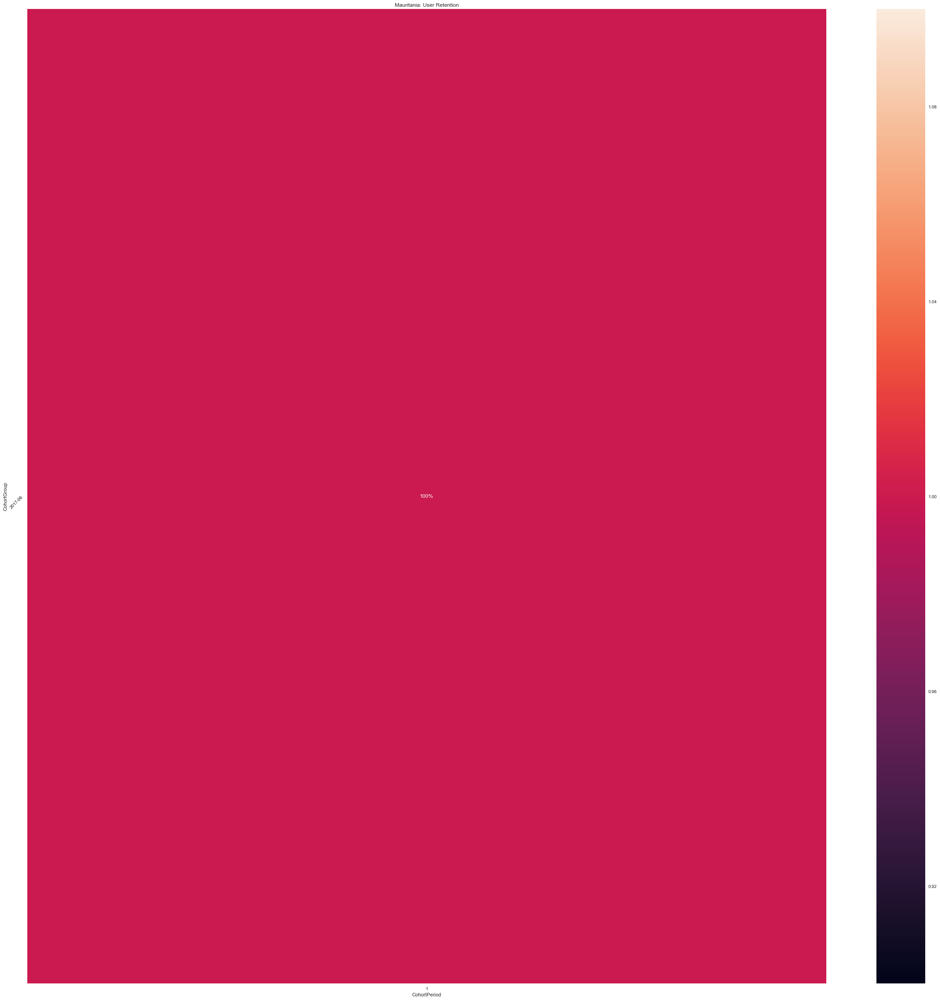

In [312]:
#Running the above algorithm on every country
for i in range(0,len(dataset.country.unique())):
    retention_rate_df = calcohort(dataset.country.unique()[i])          

In [218]:
#It should be noted that we have almost 20K cases that the json latlong file couldnt work with. These should be greatly reduced when using the google API.
len(dataset[dataset.country=='unknown'])

20027

In [322]:
#Here we can see the countries with the top retention rate. It should be noted that I simply dont have enough data for a lot of these countries. Therefore only larger countries(eg DACH, Italy, france etc) should be taken seriously.
retention_rate_df.sort_values('Gradient',ascending=False)

,Country,Gradient
125,Cape Verde,0.000000
127,Kyrgyzstan,0.000000
71,Guatemala,0.000000
85,Sao Tome and Principe,0.000000
108,Venezuela,0.000000
115,Uganda,0.000000
116,Armenia,0.000000
123,Nigeria,0.000000
114,Kuwait,-0.200000
8,Italy,-0.210073
